# Water Quality Classification

### Machine Learning Model

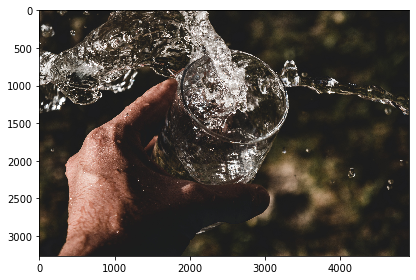

In [2]:
from PIL import Image
from skimage import io
 
img = io.imread("watersplash.jpg")
io.imshow(img)

## Water is Life
Water is essential to life. It is part of human existence and daily activities. To be safe for drinking, the water must satisfied some criteria like being tasteless, odourless and colourless. But with recent events and human activities, the criteria above can no longer satisfy how safe water can be for drinking or use as it comes polluted. Impurities like ammonia, bacteria, copper, viruses, mercury, lead and a host of other are not visible to the bare eyes.

But with laboratory testing, they can be detected if present in the water sample and based on acceptable values, the water can be determine if its fit for use or not and classification machine learning model can assist to classify into weather is safe or not safe

The dataset is a not real but it’s for the purpose of training the model and it can be pulled from Kaggle with the link below

In [ ]:
print("https://www.kaggle.com/datasets/mssmartypants/water-quality")

https://www.kaggle.com/datasets/mssmartypants/water-quality


## Importing necessary libraries for analysis

In [ ]:
#import necessary libraries

import pandas as pd
import numpy as np

## Loading the dataset and checking the data

In [ ]:
#load the dataset
wq = pd.read_csv('waterquality.csv')

In [ ]:
#checking the head of the dataset
wq.head(10)

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
5,0.94,14.47,0.03,2.88,0.003,0.80,0.43,1.38,0.11,0.67,...,0.135,9.75,1.89,0.006,27.17,5.42,0.08,0.19,0.02,1
6,2.36,5.6,0.01,1.35,0.004,1.28,0.62,1.88,0.33,0.13,...,0.021,18.60,1.78,0.007,45.34,2.84,0.10,0.24,0.08,0
7,3.93,19.87,0.04,0.66,0.001,6.22,0.10,1.86,0.86,0.16,...,0.197,13.65,1.81,0.001,53.35,7.24,0.08,0.08,0.07,0
8,0.60,24.58,0.01,0.71,0.005,3.14,0.77,1.45,0.98,0.35,...,0.167,14.66,1.84,0.004,23.43,4.99,0.08,0.25,0.08,1
9,0.22,16.76,0.02,1.37,0.007,6.40,0.49,0.82,1.24,0.83,...,0.109,4.79,1.46,0.010,30.42,0.08,0.03,0.31,0.01,1


In [ ]:
#checking the tail of the dataset
wq.tail(10)

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
7989,0.01,27.73,0.06,0.77,0.09,0.20,0.03,0.00,0.58,0.0,...,0.112,11.74,1.0,0.007,7.58,7.21,0.07,0.04,0.09,0
7990,0.00,3.11,0.07,1.24,0.07,0.06,0.03,0.04,0.74,0.0,...,0.016,15.15,1.0,0.005,0.46,6.24,0.03,0.09,0.05,0
7991,0.03,8.94,0.02,1.25,0.08,0.22,0.02,0.05,0.71,0.0,...,0.112,11.97,1.0,0.001,7.18,1.73,0.00,0.04,0.06,1
7992,0.04,10.84,0.06,0.49,0.04,0.08,0.03,0.08,0.49,0.0,...,0.151,14.44,1.0,0.003,0.34,2.16,0.06,0.03,0.05,1
7993,0.02,5.24,0.05,0.77,0.02,0.57,0.04,0.03,0.15,0.0,...,0.085,19.41,1.0,0.001,1.68,3.55,0.05,0.07,0.07,1
7994,0.05,7.78,0.00,1.95,0.04,0.10,0.03,0.03,1.37,0.0,...,0.197,14.29,1.0,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.01,0.45,0.02,0.02,1.48,0.0,...,0.031,10.27,1.0,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.03,0.05,0.05,0.02,0.91,0.0,...,0.182,15.92,1.0,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.00,2.00,0.00,0.09,0.00,0.0,...,0.000,0.00,0.0,0.000,0.00,0.00,0.00,0.00,0.00,1
7998,0.04,6.85,0.01,0.70,0.03,0.05,0.01,0.03,1.00,0.0,...,0.182,15.92,1.0,0.000,1.35,4.84,0.00,0.04,0.05,1


In [ ]:
#Checking the shape of the data
wq.shape

(7999, 21)

The dataset has 7999 observations and 21 features/variables.

In [ ]:
#Checking the datatypes of each column
wq.dtypes

aluminium      float64
ammonia         object
arsenic        float64
barium         float64
cadmium        float64
chloramine     float64
chromium       float64
copper         float64
flouride       float64
bacteria       float64
viruses        float64
lead           float64
nitrates       float64
nitrites       float64
mercury        float64
perchlorate    float64
radium         float64
selenium       float64
silver         float64
uranium        float64
is_safe         object
dtype: object

amonnia and is_safe column are not in the correct datatypes; there is possiility that there are values that are not float or interger on the columns

In [ ]:
#checking to see if there are any unique values in each column entry in the dataset
for i in wq.columns:
 print(wq[i].unique())
 print ("\n")

[1.65 2.32 1.01 1.36 0.92 0.94 2.36 3.93 0.6  0.22 3.27 1.35 1.88 4.93
 2.89 0.61 3.47 2.11 4.88 4.12 0.68 1.15 0.27 4.32 3.31 1.82 3.42 4.41
 4.57 1.69 1.87 2.71 1.63 0.01 4.49 3.52 4.35 2.51 2.34 1.71 3.45 3.37
 3.13 0.29 1.51 1.09 2.68 0.3  0.23 2.55 0.86 0.24 3.63 3.26 0.42 0.77
 0.58 3.82 2.78 3.62 3.88 4.64 2.25 0.54 4.62 2.5  3.08 3.03 2.85 1.38
 2.73 3.02 1.96 2.35 2.45 2.67 1.12 3.3  0.43 1.19 0.85 0.5  4.75 1.89
 3.75 3.32 1.75 2.66 2.76 2.63 0.04 0.88 2.22 4.91 4.8  0.47 1.62 0.09
 4.66 2.74 1.79 4.15 3.78 2.91 4.3  3.24 3.53 3.04 2.21 2.47 1.92 1.22
 2.12 4.19 4.21 4.07 2.56 3.55 3.94 0.8  2.59 3.9  3.15 0.18 3.86 1.25
 2.29 0.07 4.18 4.34 2.39 0.9  0.89 2.4  3.69 4.71 3.36 4.46 4.5  0.57
 2.69 2.17 1.32 5.   2.6  0.35 3.83 2.9  1.56 2.23 3.81 2.75 0.81 4.
 4.08 1.55 2.42 2.99 1.43 1.66 3.38 4.42 3.43 3.65 4.86 2.82 1.05 0.73
 1.21 2.15 3.6  1.73 3.35 0.37 0.79 0.99 1.86 4.84 3.09 1.72 3.29 0.11
 4.04 3.71 3.79 3.05 0.84 1.98 0.59 0.36 1.4  1.46 2.02 0.   0.93 0.78
 4.48 0.

The is_safe column has unique values 0 & 1 but there are some rows with #NUM! as value, likewise the ammonia column

## Cleaning the data

In [ ]:
#delete the rows with #NUM! as value
wq = wq[~wq.isin(['#NUM!']).any(axis=1)]

The rows with #NUM! values were deleted from the record. Deleting incomplete record was opted for to prune the dataset which is good for classification model, small dataset. After the deletion, the distribution of the dataset has 7,996 observations (3 rows were deleted) and 21 features/variables with 7,084 rows classified as unsafe as shown below 

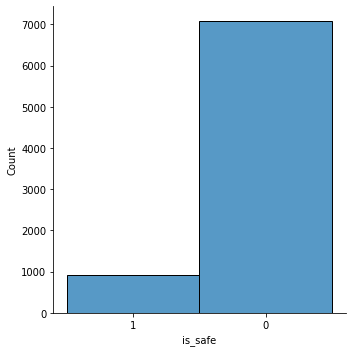

In [ ]:
# checking the distribution of the dataset
import seaborn as sns
sns.displot(wq['is_safe']) 

In [ ]:
#checking to see if there are any unique values in each column entry in the dataset
for i in wq.columns:
 print(wq[i].unique())
 print ("\n")

[1.65 2.32 1.01 1.36 0.92 0.94 2.36 3.93 0.6  0.22 3.27 1.35 1.88 4.93
 2.89 0.61 3.47 2.11 4.88 4.12 0.68 1.15 0.27 4.32 3.31 1.82 3.42 4.41
 4.57 1.69 1.87 2.71 1.63 0.01 4.49 3.52 4.35 2.51 2.34 1.71 3.45 3.37
 3.13 0.29 1.51 1.09 2.68 0.3  0.23 2.55 0.86 0.24 3.63 3.26 0.42 0.77
 0.58 3.82 2.78 3.62 3.88 4.64 2.25 0.54 4.62 2.5  3.08 3.03 2.85 1.38
 2.73 3.02 1.96 2.35 2.45 2.67 1.12 3.3  0.43 1.19 0.85 0.5  4.75 1.89
 3.75 3.32 1.75 2.66 2.76 2.63 0.04 0.88 2.22 4.91 4.8  0.47 1.62 0.09
 4.66 2.74 1.79 4.15 3.78 2.91 4.3  3.24 3.53 3.04 2.21 2.47 1.92 1.22
 2.12 4.19 4.21 4.07 2.56 3.55 3.94 0.8  2.59 3.9  3.15 0.18 3.86 1.25
 2.29 0.07 4.18 4.34 2.39 0.9  0.89 2.4  3.69 4.71 3.36 4.46 4.5  0.57
 2.69 2.17 1.32 5.   2.6  0.35 3.83 2.9  1.56 2.23 3.81 2.75 0.81 4.
 4.08 1.55 2.42 2.99 1.43 1.66 3.38 4.42 3.43 3.65 4.86 2.82 1.05 0.73
 1.21 2.15 3.6  1.73 3.35 0.37 0.79 0.99 1.86 4.84 3.09 1.72 3.29 0.11
 4.04 3.71 3.79 3.05 0.84 1.98 0.59 0.36 1.4  1.46 2.02 0.   0.93 0.78
 4.48 0.

No rows with the #NUM! value; the rows had been deleted

In [ ]:
wq.shape

(7996, 21)

The dataset now has 7996 observations (3 rows were deleted) and 21 features/variables.

In [ ]:
#checking for missing values
wq.isnull().sum().sum()

0

None of the coloumns has null value

In [ ]:
#checking for duplicates
wq.duplicated().sum().sum()

0

No duplicate in the dataset

In [ ]:
#changing the datatypes of ammonia and is_safe columns
wq["ammonia"] = wq["ammonia"].astype(float)
wq['is_safe'] = wq['is_safe'].astype(int)


In [ ]:
#rechecking the dataset
wq.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7996 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7996 non-null   float64
 1   ammonia      7996 non-null   float64
 2   arsenic      7996 non-null   float64
 3   barium       7996 non-null   float64
 4   cadmium      7996 non-null   float64
 5   chloramine   7996 non-null   float64
 6   chromium     7996 non-null   float64
 7   copper       7996 non-null   float64
 8   flouride     7996 non-null   float64
 9   bacteria     7996 non-null   float64
 10  viruses      7996 non-null   float64
 11  lead         7996 non-null   float64
 12  nitrates     7996 non-null   float64
 13  nitrites     7996 non-null   float64
 14  mercury      7996 non-null   float64
 15  perchlorate  7996 non-null   float64
 16  radium       7996 non-null   float64
 17  selenium     7996 non-null   float64
 18  silver       7996 non-null   float64
 19  uraniu

The columns are in the correct datatypes and ready to be used for the model

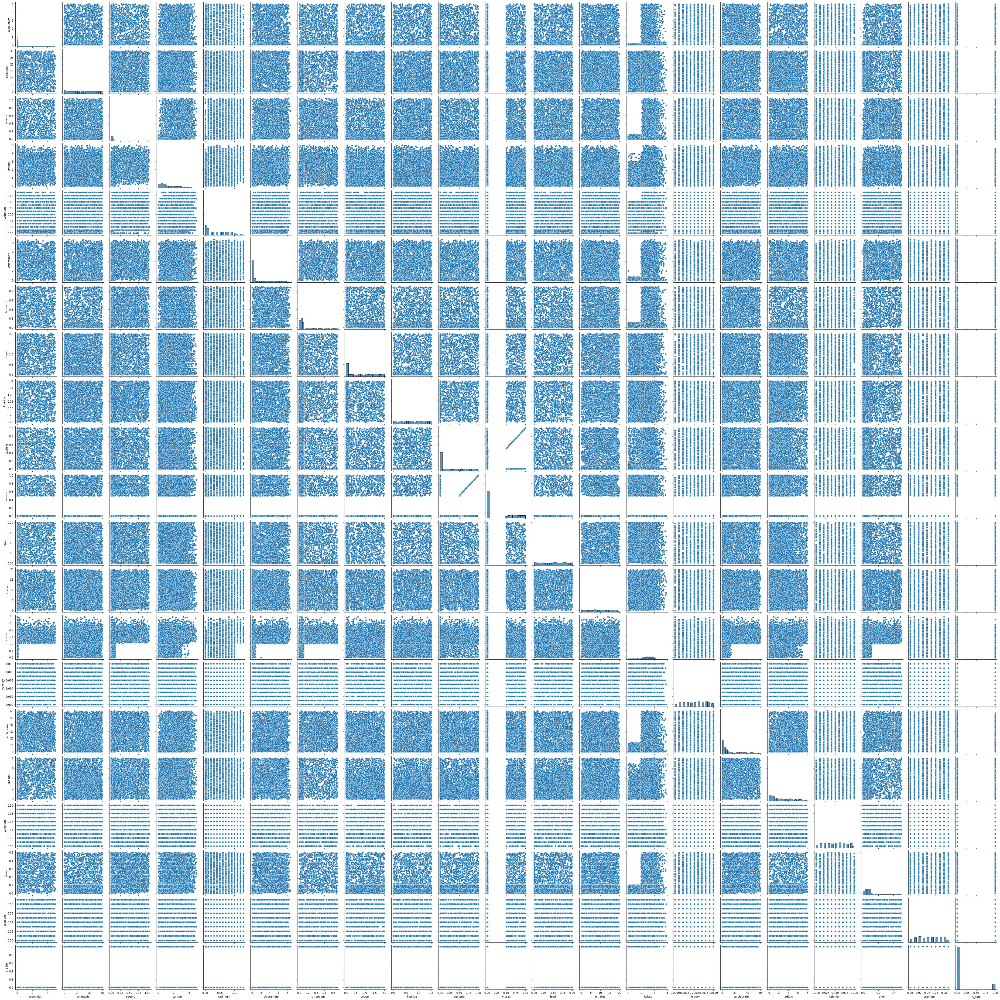

In [ ]:
#pair plot of the aataset
sns.pairplot(wq)

# Time to Build the Model

### Importing sklearn libraries

In [ ]:
from sklearn.model_selection import train_test_split #to split and train the data
from sklearn.preprocessing import MinMaxScaler #not to have a bias of really large numbers
from sklearn.neighbors import KNeighborsClassifier #to classify the data
from sklearn import preprocessing 

#libraries to test how good the model is
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score

import math

In [ ]:
#checking and round up the summary on the dataet
wq.describe().round(2)

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
count,7996.00,7996.00,7996.00,7996.00,7996.00,7996.00,7996.00,7996.00,7996.00,7996.00,...,7996.00,7996.00,7996.00,7996.00,7996.00,7996.00,7996.00,7996.00,7996.00,7996.00
mean,0.67,14.28,0.16,1.57,0.04,2.18,0.25,0.81,0.77,0.32,...,0.10,9.82,1.33,0.01,16.47,2.92,0.05,0.15,0.04,0.11
std,1.27,8.88,0.25,1.22,0.04,2.57,0.27,0.65,0.44,0.33,...,0.06,5.54,0.57,0.00,17.69,2.32,0.03,0.14,0.03,0.32
min,0.00,-0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.04,6.58,0.03,0.56,0.01,0.10,0.05,0.09,0.41,0.00,...,0.05,5.00,1.00,0.00,2.17,0.82,0.02,0.04,0.02,0.00
50%,0.07,14.13,0.05,1.19,0.04,0.53,0.09,0.75,0.77,0.22,...,0.10,9.93,1.42,0.00,7.74,2.41,0.05,0.08,0.05,0.00
75%,0.28,22.13,0.10,2.48,0.07,4.24,0.44,1.39,1.16,0.61,...,0.15,14.61,1.76,0.01,29.49,4.67,0.07,0.24,0.07,0.00
max,5.05,29.84,1.05,4.94,0.13,8.68,0.90,2.00,1.50,1.00,...,0.20,19.83,2.93,0.01,60.01,7.99,0.10,0.50,0.09,1.00


Before Normalisation

In [ ]:
#split the dataset into training set and test set
X = wq.iloc[:, 0:20]
y = wq.iloc[:, 20]
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.2)

The dataset was splitted into 80% training set and 20% testing set with all the rows and first 20 features as independent variable and all the rows and the last column as the dependent variable.

In [ ]:
#to display up to 100 values on the screen
np.set_printoptions(edgeitems=100)

In [ ]:
#Feature scaling: keeping the values between 0 to 1
sc_X = MinMaxScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)
X_train

array([[4.69306931e-01, 7.07023411e-01, 3.33333333e-01, 7.40890688e-01,
        6.15384615e-01, 6.49769585e-01, 7.55555556e-01, 3.30000000e-01,
        6.00000000e-01, 0.00000000e+00, 0.00000000e+00, 4.97487437e-01,
        1.40980293e-01, 6.68941980e-01, 3.00000000e-01, 8.43859357e-01,
        4.01752190e-01, 8.00000000e-01, 5.40000000e-01, 5.55555556e-01],
       [1.18811881e-02, 2.90301003e-01, 8.57142857e-02, 1.82186235e-01,
        7.69230769e-02, 2.07373272e-02, 1.11111111e-02, 5.05000000e-01,
        4.53333333e-01, 1.10000000e-01, 6.00000000e-03, 6.33165829e-01,
        7.61495705e-01, 4.64163823e-01, 6.00000000e-01, 7.83202800e-02,
        9.63704631e-02, 0.00000000e+00, 2.00000000e-01, 1.11111111e-01],
       [1.18811881e-02, 8.03678930e-01, 4.76190476e-02, 2.61133603e-01,
        0.00000000e+00, 1.95852535e-02, 1.00000000e-01, 4.60000000e-01,
        7.26666667e-01, 7.50000000e-01, 7.50000000e-01, 4.22110553e-01,
        3.04194037e-01, 4.53924915e-01, 9.00000000e-01, 2.9995

Feature Scaling: We will be performing normalisation on the dataset because the independent variables are not too wide apart (values ranges from -0 to 29). The feature scaling will make the model perform optimally or converge faster when the different observations (min and max) are on a smaller scale, say between 0 and 1, thereby leading to an accurate model. 
The image below is the description of the dataset before and after normalisation was performed on it


In [ ]:
X_train = pd.DataFrame(X_train)
X_train.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
count,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000,6396.000000
mean,0.132757,0.479340,0.153825,0.314866,0.329190,0.251046,0.275347,0.401665,0.514875,0.317159,0.328962,0.498727,0.495585,0.454667,0.520497,0.272651,0.364500,0.498671,0.292699,0.496387
std,0.251436,0.297692,0.239721,0.245537,0.275451,0.296431,0.301364,0.327214,0.290566,0.328885,0.377421,0.291589,0.280246,0.196294,0.295746,0.293722,0.290492,0.288437,0.284728,0.299197
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.007921,0.219983,0.028571,0.111336,0.061538,0.010369,0.055556,0.045000,0.266667,0.000000,0.002000,0.241206,0.253663,0.341297,0.300000,0.036161,0.102628,0.300000,0.080000,0.222222
50%,0.013861,0.475251,0.047619,0.238866,0.307692,0.059908,0.100000,0.370000,0.513333,0.220000,0.008000,0.507538,0.502779,0.484642,0.500000,0.127895,0.300375,0.500000,0.160000,0.555556
75%,0.055446,0.742475,0.095238,0.498482,0.538462,0.487327,0.488889,0.695000,0.773333,0.610000,0.700000,0.758794,0.737746,0.601536,0.800000,0.489085,0.580726,0.700000,0.480000,0.777778
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


After Normalisation

## Fitting & Predicting the Model

In [ ]:
#determining the value of K
math.sqrt(len(y_train))

79.97499609252883

Since K in the KNN model is a hyper parameter, its value was calculated, the result came up to 79; this will be perfect to use because it’s not an even number. Assumming its an even number, one will be subtracted to give an odd number
The model was initialised with k = 79, p = 2 (since the target variable is either safe or is_not safe) using the Euclidean distance.

In [ ]:
#define the model: initialise K-NN
classifier = KNeighborsClassifier(n_neighbors=79, p=2, metric = 'euclidean')

In [ ]:
#fit the model
classifier.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=79)

In [ ]:
#predict the test set result
y_pred = classifier.predict(X_test)
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..., 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0])

## Evaluating the Model

The use of confusion matrix was implored to evaluate the model and the output is displayed below with its heatmaps

In [ ]:
#evaluate the model
cm = confusion_matrix(y_test, y_pred, labels = [0,1])
print("Consusion Matrix: ")
print (cm)

Consusion Matrix: 
[[1417    2]
 [ 148   33]]


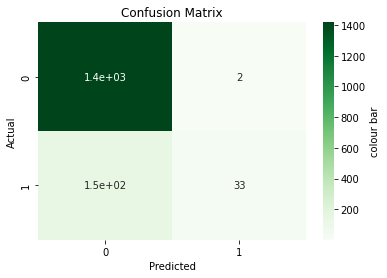

In [ ]:
#ploting the confusion matrix heatmap
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(cm, cmap = "Greens", annot = True, cbar_kws={"orientation":"vertical", "label":"colour bar"}, 
            xticklabels = [0,1], yticklabels = [0,1])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

From the output, there were 41 cases whose actual label was one and were predicted as one; 1,413 cases whose actual label was zero and was predicted as zero. Six cases whose actual label was zero but predicted as one; 140 cases where the actual label were one but predicted as zero.

To clearly understanding the ratio in the confusion matrix, we normalised the matrix as shown below;

In [ ]:
print("Normalised Confusion Matrix: ")
cm_normalised = np.round(cm/np.sum(cm, axis =1).reshape(-1,1), 4)
print(cm_normalised)

Normalised Confusion Matrix: 
[[0.9986 0.0014]
 [0.8177 0.1823]]


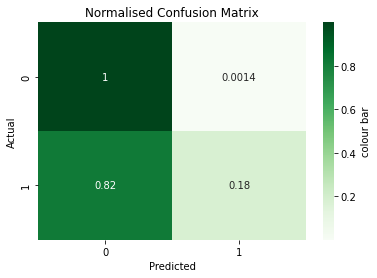

In [ ]:
#ploting the normalised confusion matrix heatmap
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(cm_normalised, cmap = "Greens", annot = True, cbar_kws={"orientation":"vertical", "label":"colour bar"}, 
            xticklabels = [0,1], yticklabels = [0,1])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Normalised Confusion Matrix")
plt.show()

From the figure above, it shows that the true negative (TP) were almost 100% predicted correctly and the true positive (TP) were 23% predicted correctly.

## Accuracy of the Model

For a concise accuracy report, classification_import module was used.

Below is the accuracy of the model when tested. The result is discussed as follows. 

In [ ]:
from sklearn.metrics import classification_report
cr = classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.91      1.00      0.95      1419
           1       0.94      0.18      0.31       181

    accuracy                           0.91      1600
   macro avg       0.92      0.59      0.63      1600
weighted avg       0.91      0.91      0.88      1600



Precision: Only 87% of the total water sample that the model predicted as ‘is_safe’ was actually safe.

Recall: Out of all the water sample that actually is_safe, the model only predicted this outcome correctly for 23% of those samples.

F1 Score: Since the value isn’t very close to 1, it tells that the model does a poor job of predicting whether or not the water is safe

Support: The values under the support column relate how many water samples belonged to each class in the test dataset, among the water samples in the test dataset, 1,419 was not safe and 181 were safe.
